In [ ]:
!pip install diffusers transformers accelerate safetensors torch torchvision pillow


In [ ]:
### Notebook re-saved using Google Colab
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import os


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
)

pipe = pipe.to("cuda")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [ ]:
prompts = [
    "A futuristic city at night",
    "A cute cat wearing sunglasses",
    "A mountain landscape with river",
    "A robot reading a book",
    "A cyberpunk street scene"
]


In [ ]:
os.makedirs("generated_images", exist_ok=True)


In [ ]:
for i, prompt in enumerate(prompts):
    image = pipe(prompt).images[0]
    image.save(f"generated_images/image_{i+1}.png")
    print(f"Saved image_{i+1}.png")


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image_3.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image_4.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved image_5.png


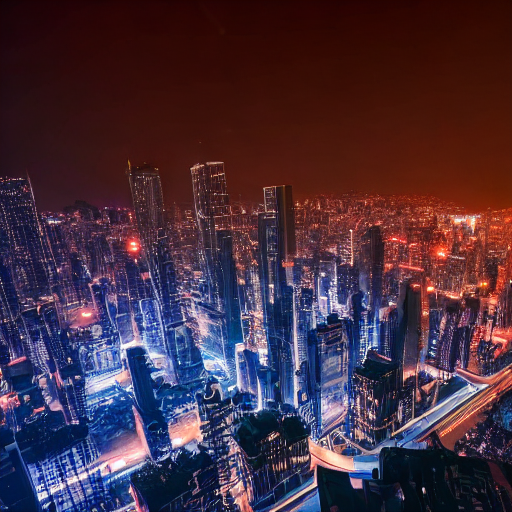

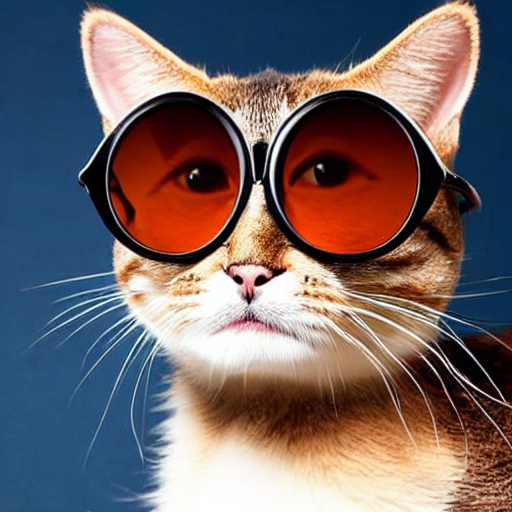

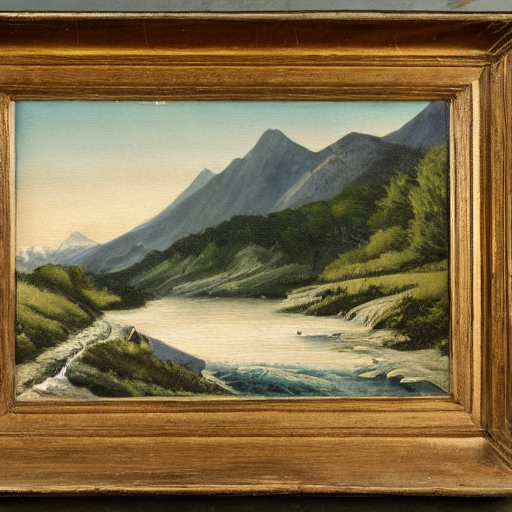

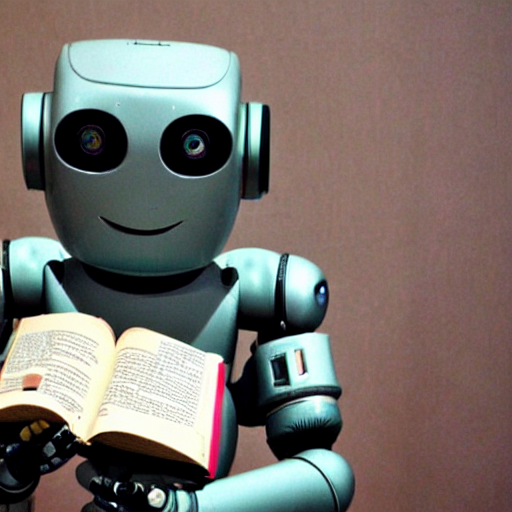

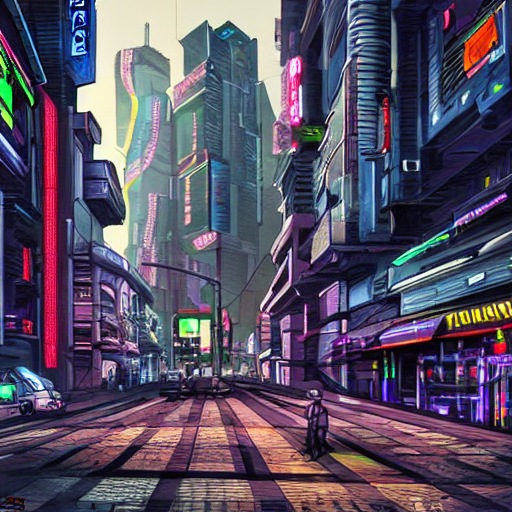

In [ ]:
from IPython.display import display

for i in range(1, 6):
    img = Image.open(f"generated_images/image_{i}.png")
    display(img)


In [ ]:
from google.colab import files
import shutil

shutil.make_archive("synthetic_dataset", "zip", "generated_images")
files.download("synthetic_dataset.zip")



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
dog_breeds = [
    "Golden Retriever",
    "German Shepherd",
    "Labrador Retriever",
    "Pug",
    "Bulldog",
    "Beagle",
    "Rottweiler",
    "Doberman",
    "Siberian Husky",
    "Chihuahua"
]


In [ ]:
base_folder = "dog_dataset"
os.makedirs(base_folder, exist_ok=True)


In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

def auto_generate_and_show():
    # 1. Randomly pick a breed
    breed = random.choice(dog_breeds)

    # 2. Create breed folder if not exists
    breed_folder = os.path.join(base_folder, breed.replace(" ", "_"))
    os.makedirs(breed_folder, exist_ok=True)

    # 3. Prompt
    prompt = f"A high quality photo of a {breed} dog"

    # 4. Generate image
    image = pipe(prompt).images[0]

    # 5. Auto image numbering
    img_count = len(os.listdir(breed_folder)) + 1
    img_path = os.path.join(breed_folder, f"img{img_count}.png")
    image.save(img_path)

    # 6. Display image
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{breed} | img{img_count}")
    plt.show()

    print(f"Image saved at: {img_path}")


  0%|          | 0/50 [00:00<?, ?it/s]

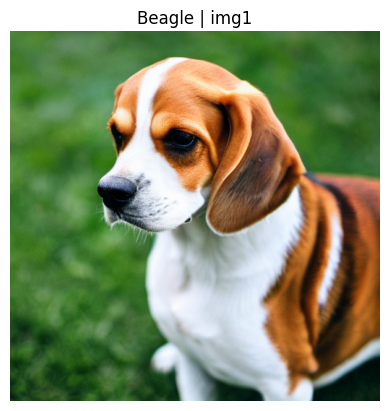

Image saved at: dog_dataset/Beagle/img1.png


In [ ]:
auto_generate_and_show()


  0%|          | 0/50 [00:00<?, ?it/s]

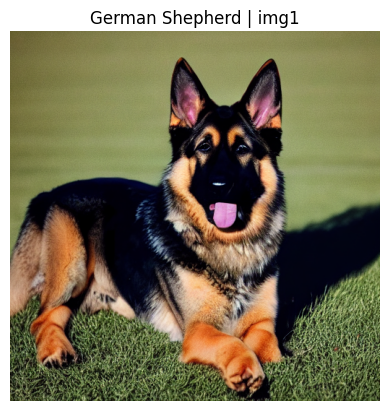

Image saved at: dog_dataset/German_Shepherd/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

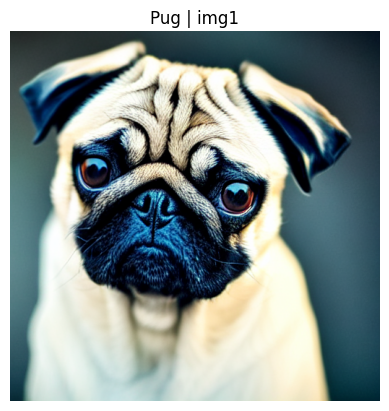

Image saved at: dog_dataset/Pug/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

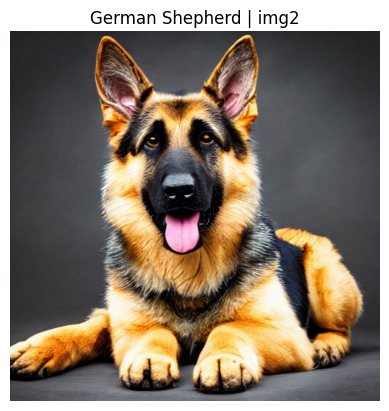

Image saved at: dog_dataset/German_Shepherd/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

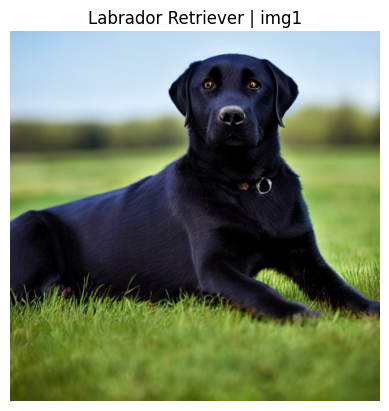

Image saved at: dog_dataset/Labrador_Retriever/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

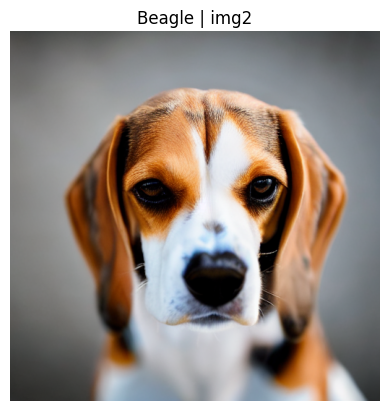

Image saved at: dog_dataset/Beagle/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

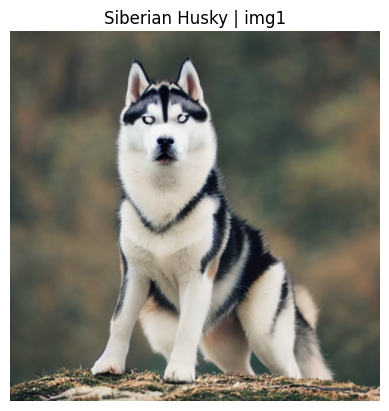

Image saved at: dog_dataset/Siberian_Husky/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

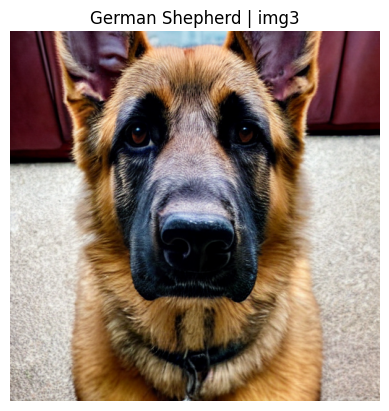

Image saved at: dog_dataset/German_Shepherd/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

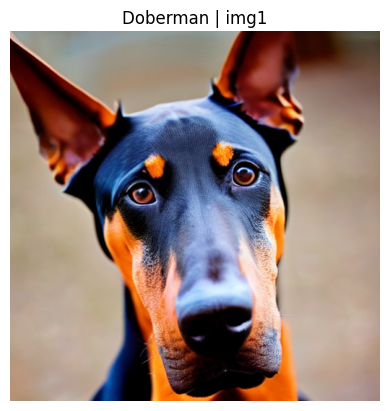

Image saved at: dog_dataset/Doberman/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

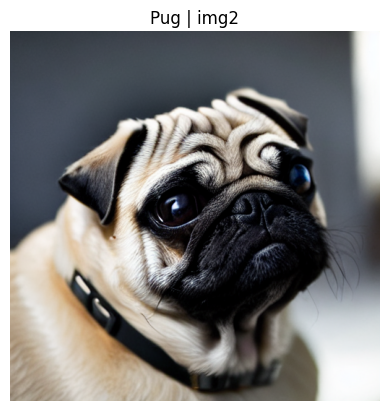

Image saved at: dog_dataset/Pug/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

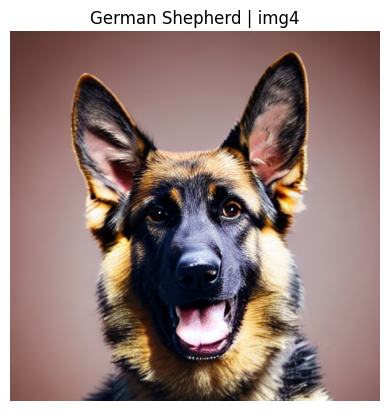

Image saved at: dog_dataset/German_Shepherd/img4.png


  0%|          | 0/50 [00:00<?, ?it/s]

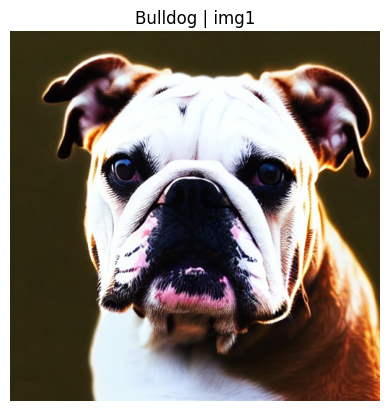

Image saved at: dog_dataset/Bulldog/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

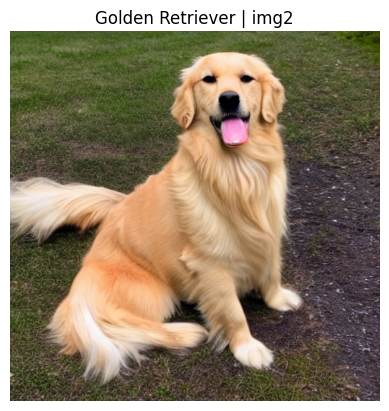

Image saved at: dog_dataset/Golden_Retriever/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

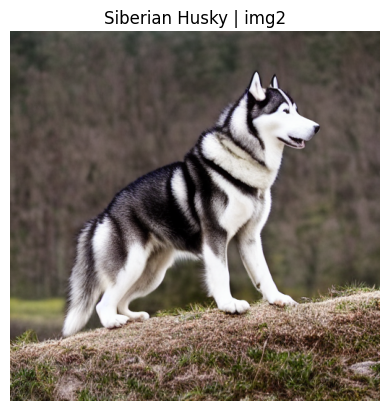

Image saved at: dog_dataset/Siberian_Husky/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

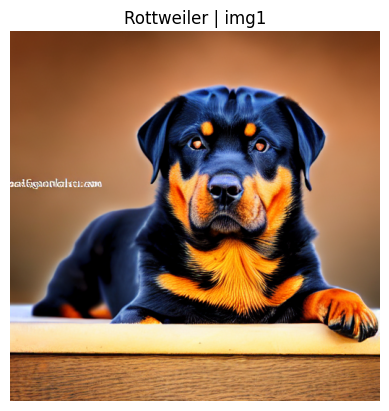

Image saved at: dog_dataset/Rottweiler/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

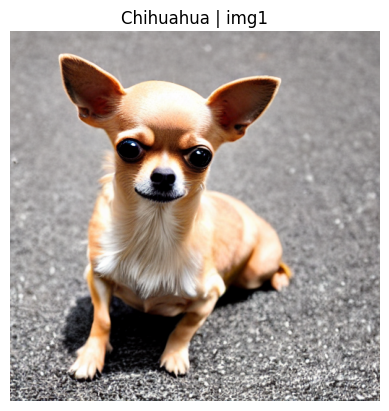

Image saved at: dog_dataset/Chihuahua/img1.png


  0%|          | 0/50 [00:00<?, ?it/s]

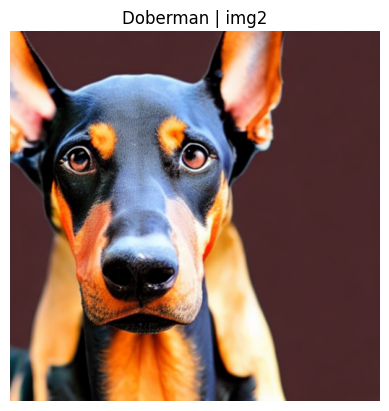

Image saved at: dog_dataset/Doberman/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

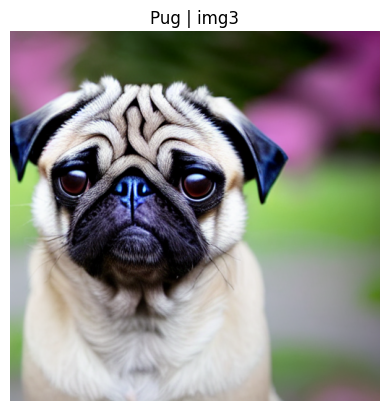

Image saved at: dog_dataset/Pug/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

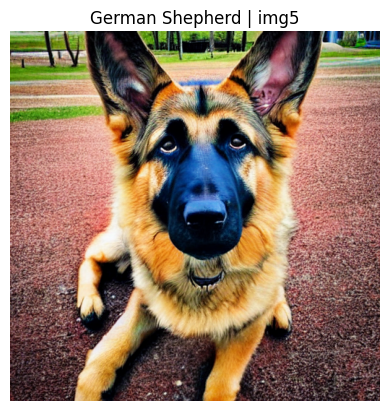

Image saved at: dog_dataset/German_Shepherd/img5.png


  0%|          | 0/50 [00:00<?, ?it/s]

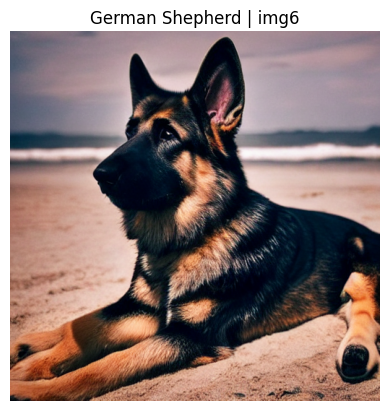

Image saved at: dog_dataset/German_Shepherd/img6.png


  0%|          | 0/50 [00:00<?, ?it/s]

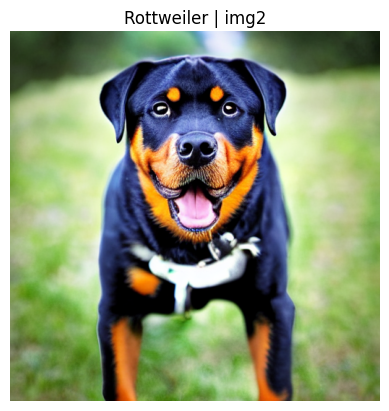

Image saved at: dog_dataset/Rottweiler/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

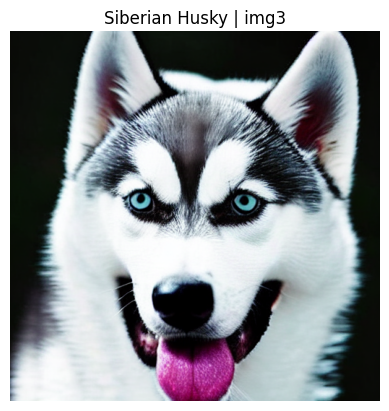

Image saved at: dog_dataset/Siberian_Husky/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

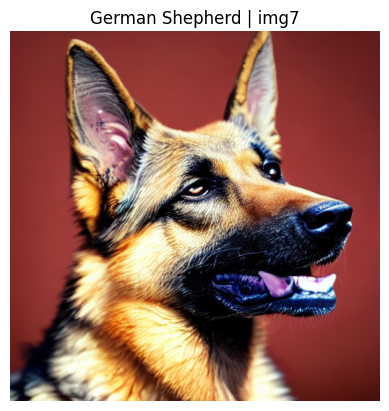

Image saved at: dog_dataset/German_Shepherd/img7.png


  0%|          | 0/50 [00:00<?, ?it/s]

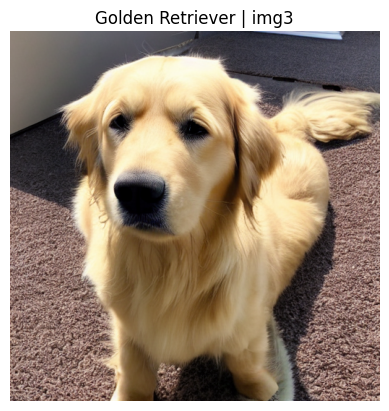

Image saved at: dog_dataset/Golden_Retriever/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

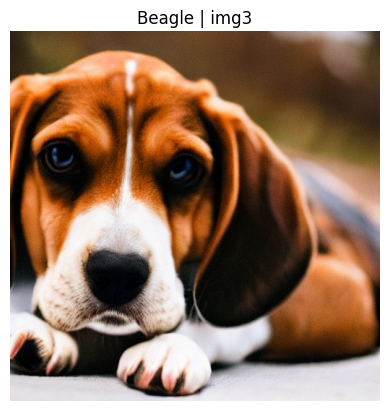

Image saved at: dog_dataset/Beagle/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

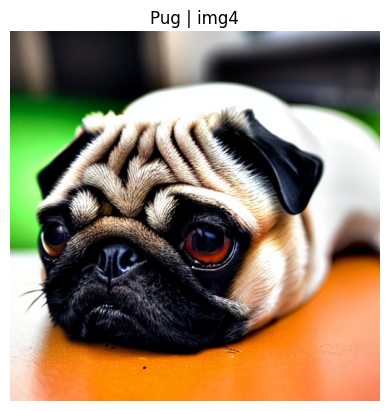

Image saved at: dog_dataset/Pug/img4.png


  0%|          | 0/50 [00:00<?, ?it/s]

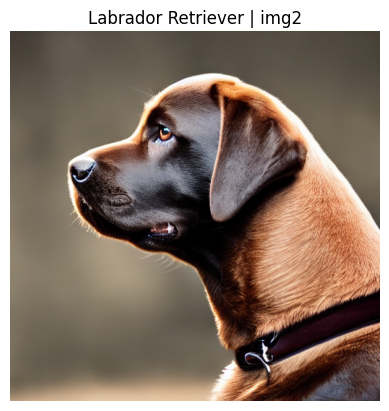

Image saved at: dog_dataset/Labrador_Retriever/img2.png


  0%|          | 0/50 [00:00<?, ?it/s]

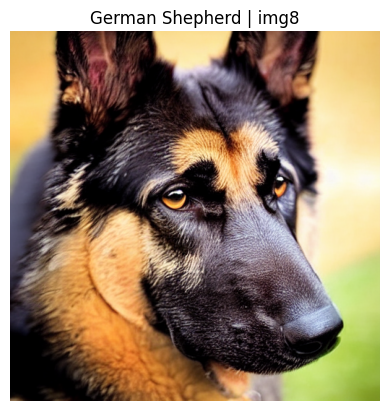

Image saved at: dog_dataset/German_Shepherd/img8.png


  0%|          | 0/50 [00:00<?, ?it/s]

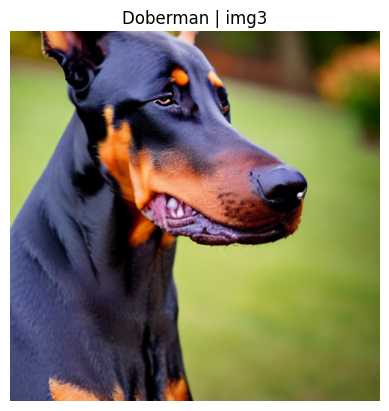

Image saved at: dog_dataset/Doberman/img3.png


  0%|          | 0/50 [00:00<?, ?it/s]

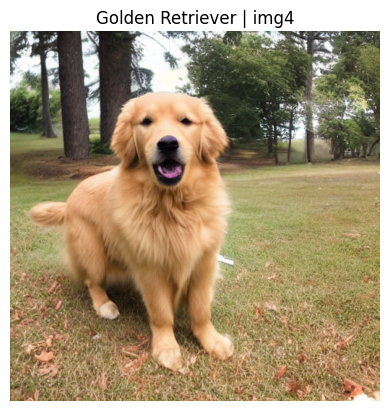

Image saved at: dog_dataset/Golden_Retriever/img4.png


  0%|          | 0/50 [00:00<?, ?it/s]

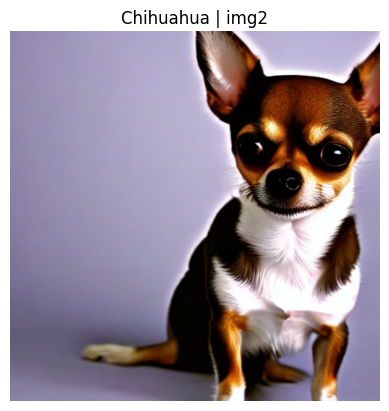

Image saved at: dog_dataset/Chihuahua/img2.png


In [ ]:
for _ in range(30):   # 10 breeds × 3 images
    auto_generate_and_show()
